# Lab 6.1 Fine-Tuning

In this notebook you will explore fine-tuning a CNN to classify pet breeds.

In [ ]:
# device = 'cpu'
device = 'cuda' # set this if using GPU on Colab for example

Here is some code to download a prepared version of the [Oxford-IIIT Pet dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/).

In [ ]:
import os
if not os.path.exists('oxford_pets.zip'):
  !wget "https://www.dropbox.com/scl/fi/p49ifha27c2u3uptfj42w/oxford_pets_corrected.zip?rlkey=dwk3dsptzir8v846imsq6bgw3&dl=1" -O oxford_pets.zip
  !unzip -qq oxford_pets.zip

In [ ]:
!pip install torchmetrics
import torch
import torch.nn as nn
import torchvision
import torchmetrics
import numpy as np
from matplotlib import pyplot as plt
from tqdm import tqdm

The following code sets up dataset and dataloaders for the data.  It creates two versions: the `no_transform` version does not apply any transformations, and the other one applies the appropriate transformations for the VGG16 model (resize, recropping, centering, and scaling).

In [ ]:
transforms = torchvision.models.VGG16_Weights.IMAGENET1K_V1.transforms()

train_ds_no_transform = torchvision.datasets.ImageFolder(
    'oxford_pets/train',
)
train_ds = torchvision.datasets.ImageFolder(
    'oxford_pets/train',
    transform=transforms
)
train_loader = torch.utils.data.DataLoader(train_ds, batch_size=32, shuffle=True)
test_ds_no_transform = torchvision.datasets.ImageFolder(
    'oxford_pets/test',
)
test_ds = torchvision.datasets.ImageFolder(
    'oxford_pets/test',
    transform=transforms
)
test_loader = torch.utils.data.DataLoader(test_ds, batch_size=32, shuffle=False)

In [ ]:
train_ds

In [ ]:
image,label = next(iter(train_ds_no_transform))
plt.imshow(image)
plt.title(train_ds.classes[label])

Now we will grab the VGG16 model with pretrained weights.

In [ ]:
vgg16 = torchvision.models.vgg16(weights=torchvision.models.VGG16_Weights.IMAGENET1K_V1).to(device)

In [ ]:
vgg16

### Exercises

1. Iterate through the parameters of the `features` part of VGG16 and set `requires_grad=False` on each parameter.

In [ ]:
for param in vgg16.features.parameters():
    param.requires_grad=False

2. Replace the `classifier` part of the network with a new `Sequential` model that has 35 outputs for the 35 pet breeds.

*Note:* You can do `vgg16.classifier = nn.Sequential(...).to(device)`.

In [ ]:
vgg16.classifier = nn.Sequential(
    nn.Linear(in_features=25088, out_features=4096, bias=True),
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(in_features=4096, out_features=4096, bias=True),
    nn.ReLU(inplace=True),
    nn.Dropout(p=0.5, inplace=False),
    nn.Linear(in_features=4096, out_features=35, bias=True)
).to(device)

3. Use the following code to check the test set accuracy of the model *before* training it.  Interpret the result.

In [19]:
metric = torchmetrics.Accuracy('multiclass', num_classes=35).to(device)
metric.reset()
for x_batch, y_batch in test_loader:
    y_pred = vgg16(x_batch.to(device))
    metric(y_pred, y_batch.to(device))
metric.compute()

tensor(0.0325, device='cuda:0')

5. Now train the model on the training set for three epochs.

In [20]:
def compute_model_acc(model: torch.nn.Sequential, loader: torch.utils.data.DataLoader) -> float:
    num_correct = 0
    n = 0
    
    model.eval()
    with torch.no_grad():
        for X_batch, y_batch in loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            z_batch = model(X_batch)
            y_predict = torch.argmax(z_batch, dim=1)
            num_correct += torch.sum(y_predict == y_batch)
            n += len(y_batch)
        
    return num_correct / n

In [21]:
loss_fn = torch.nn.CrossEntropyLoss()
opt = torch.optim.Adam(vgg16.parameters(), lr=1e-3, weight_decay=1e-4)

epochs = 3
for epoch in range(epochs):
    vgg16.train()

    running_correct = 0
    total_samples = 0

    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        opt.zero_grad() # zero out the gradients
        z_batch = vgg16(X_batch) # compute z values
        loss = loss_fn(z_batch,y_batch) # compute loss
        loss.backward() # compute gradients
        opt.step() # apply gradients

        # # calculate accuracy
        # y_predict = torch.argmax(z_batch, dim=1)
        # running_correct += (y_predict == y_batch).sum().item()
        # total_samples += y_batch.size(0)

    # epoch_train_acc = running_correct / total_samples
    print(f'epoch {epoch}: loss is {loss.item():.4f} -- training accuracy is {compute_model_acc(vgg16, test_loader):.4f}, test accuracy is {compute_model_acc(vgg16, test_loader):.4f}')
    # print(f'epoch {epoch}: loss is {loss.item():.4f} -- training accuracy is {epoch_train_acc:.4f}, test accuracy is {compute_model_acc(vgg16, test_loader):.4f}')

epoch 0: loss is 2.0589 -- training accuracy is 0.7862, test accuracy is 0.7862
epoch 1: loss is 1.2735 -- training accuracy is 0.8146, test accuracy is 0.8146
epoch 2: loss is 1.0805 -- training accuracy is 0.8268, test accuracy is 0.8268


6. Evaluate the accuracy of the fine-tuned model on the test set.

In [22]:
vgg16.eval()
metric.reset()
for x_batch, y_batch in test_loader:
    y_pred = vgg16(x_batch.to(device))
    metric(y_pred, y_batch.to(device))
metric.compute()

tensor(0.8268, device='cuda:0')

7. The following code will show some test images with the correct and predicted labels.

In [23]:
vgg16.eval()
preds = []
for x_batch, y_batch in test_loader:
    y_pred = vgg16(x_batch.to(device))
    y_pred = torch.argmax(y_pred,dim=-1)
    preds.append(y_pred.detach().cpu().numpy())
preds = np.concatenate(preds,axis=0)

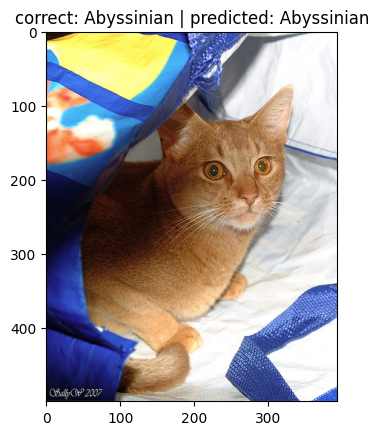

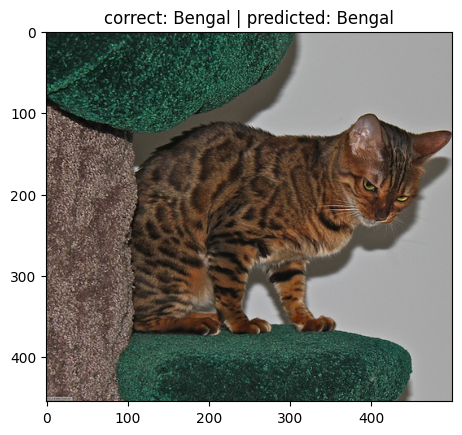

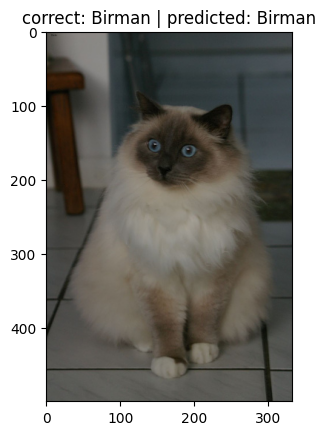

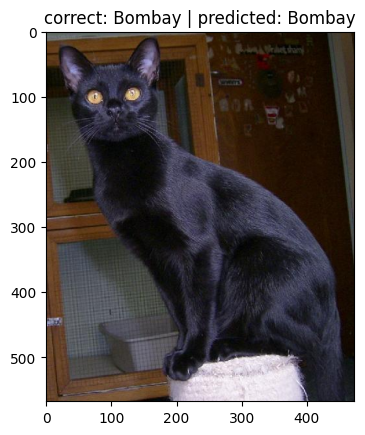

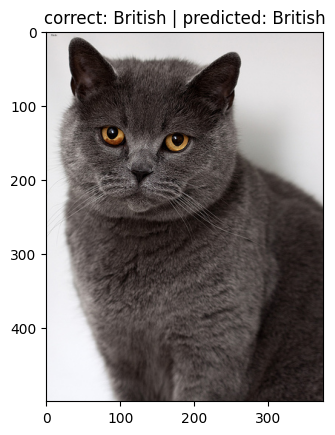

...

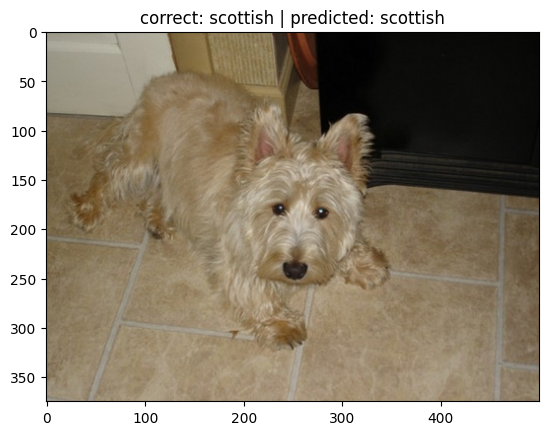

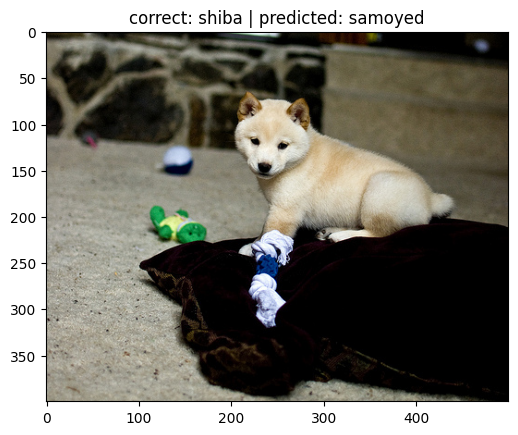

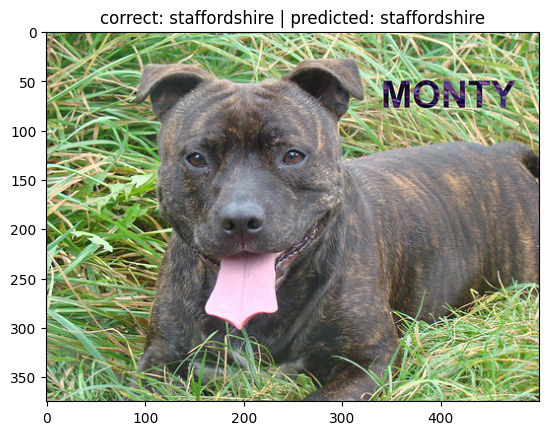

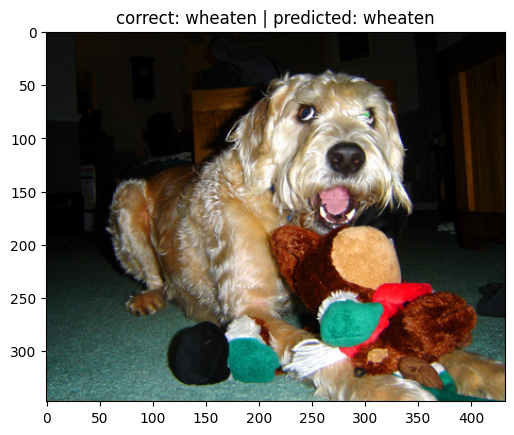

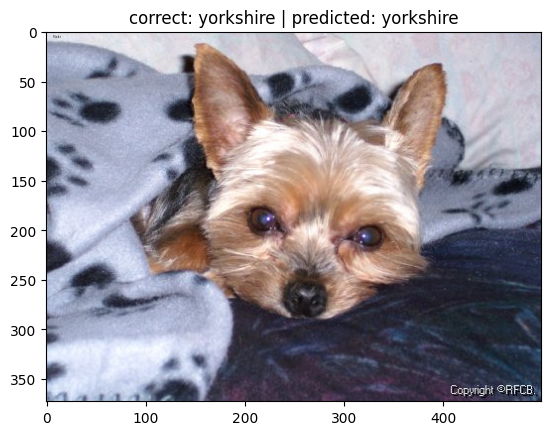

In [ ]:
i = 0
for (im,label), pred in zip(test_ds_no_transform,preds):
  if i%20 == 0:
    plt.imshow(im)
    plt.title(f'correct: {test_ds.classes[label]} | predicted: {test_ds.classes[pred]}')
    plt.show()
  i += 1